#e[PY]s: A Python Library for SciOps Analysis

##Define a few support things...


The following autoreloads packages and sub-packages before each call. This removes the need to restart the kernel after each change to the packages, in particular to pyops.

In [1]:
%load_ext autoreload
%autoreload 2
from IPython.display import HTML, SVG
from IPython import display
from IPython.html.widgets import interact, interactive, fixed
from IPython.html import widgets
try:
    import seaborn as sns
    sns.set(color_codes=True)
except:
    pass
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.figsize'] = (20.0, 10.0)
import pyops # pronounce e-pie-s
import cPickle as pickle 
from datetime import datetime as dt
import pandas as pd
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
import numpy as np
import plotly.plotly as py
import plotly.tools as tls
from plotly.graph_objs import Data, Layout, Figure, XAxis, YAxis, Scatter, Line, Legend
import os

:0: FutureWarning: IPython widgets are experimental and may change in the future.


In [2]:
ls test/data

actions.out             DS_latency_csv.out      module_states.out
conflicts2_csv.out      DS_transfers2_csv.out   power_avg2_csv.out
conflicts_csv.out       DS_transfers_csv.out    power_avg_csv.out
conflicts.out           imagedatadump.dat       power_avg.out
data_rate_avg2_csv.out  modes2_csv.out          power_budget.pwr
data_rate_avg_csv.out   modes_csv.out           state_params.out
data_rate_avg.out       modes.out               timeline2_csv.out
downlink_profile.brf    module_states2_csv.out  timeline_csv.out
DS_latency2_csv.out     module_states_csv.out   timeline.out


In [3]:
power_avg_file = 'test/data/power_avg.out'
data_rate_avg_file = 'test/data/data_rate_avg.out'

power_avg_file = 'test/data/power_avg_csv.out'
data_rate_avg_file = 'test/data/data_rate_avg2_csv.out'

power_budget_file= 'test/data/power_budget.pwr'
downlink_budget_file= 'test/data/downlink_profile.brf'

###So let's read-in some data

 We set the <b>power usage file</b> earlier (though not on screen). Executing the variable name in a cell shows the file path and name.

In [4]:
power_avg_file

'test/data/power_avg_csv.out'

Now we read it in by creating an instance of the **powertable** class.

In [19]:
power_usage = pyops.powertable(power_avg_file)

172 redundant lines removed



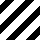
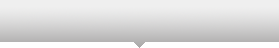
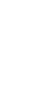
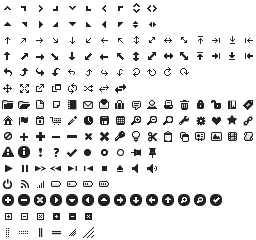
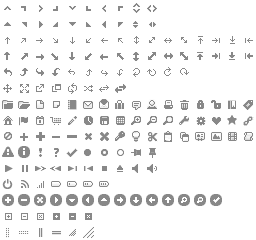
...
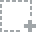
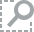
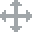
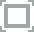
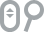

In [47]:
power_usage.power_plot()

In [22]:
power_usage.head()

,Total,ANTENNA_X,ANTENNA_KA,SSMM,BELA,ISA,MERMAG,MERTIS,MGNS,MIXS_SIXS,PHEBUS,SERENA,SIMBIOSYS
Date & Time,,,,,,,,,,,,,
2022-10-06 20:00:00,42.22,0,0,0,13.47,11.75,0,5.1,3.5,0,6,2.4,0
2022-10-06 20:15:00,42.22,0,0,0,13.47,11.75,0,5.1,3.5,0,6,2.4,0
2022-10-06 20:16:00,68.02,0,0,0,13.47,11.75,0,11.3,4.5,0,6,21.0,0
2022-10-06 20:17:00,69.62,0,0,0,13.47,11.75,0,12.9,4.5,0,6,21.0,0
2022-10-06 20:18:00,69.62,0,0,0,13.47,11.75,0,12.9,4.5,0,6,21.0,0


And we can look at the start of the header...

In [43]:
power_usage.header

{'CFG Template': 'v3.19',
 'EDF Template': 'v3.12',
 'EPS Version': 'v2.5.36',
 'EVF (ESOC FD)': 'DDID appendix-H v2.1',
 'EVF Template': 'v3.1',
 'File Contents': 'Average Power Values',
 'Generation Time': '21-July-2015_06',
 'ITL Template': 'v3.10',
 'Input CFG': 'eps.cfg',
 'Input EDF': 'bepi.edf',
 'Input EVF': 'bepi_events_mpo_sft.evf',
 'Input Timeline': 'BC-SFT2_FM-FUNC_VER-ITL-GEN01A.itl',
 'MDB version': 'SISBCMAS "PFM v5.0 (1, 5, 0)"',
 'Output Filename': 'power_avg.out',
 'POR Definition': 'CRID issue C4',
 'Ref_date': '6-October-2022',
 'experiments': ['ANTENNA_X',
  'ANTENNA_KA',
  'SSMM',
  'BELA',
  'ISA',
  'MERMAG',
  'MERTIS',
  'MGNS',
  'MIXS_SIXS',
  'PHEBUS',
  'SERENA',
  'SIMBIOSYS'],
 'headings': ['Elapsed time',
  'Total',
  'ANTENNA_X',
  'ANTENNA_KA',
  'SSMM',
  'BELA',
  'ISA',
  'MERMAG',
  'MERTIS',
  'MGNS',
  'MIXS_SIXS',
  'PHEBUS',
  'SERENA',
  'SIMBIOSYS'],
 'units': ['ddd_hh:mm:ss',
  '(Watts)',
  'Watts',
  'Watts',
  'Watts',
  'Watts',
  'Watt

Or query some part of its dictionary object by passing it a key

In [42]:
power_usage.header['experiments']

['ANTENNA_X',
 'ANTENNA_KA',
 'SSMM',
 'BELA',
 'ISA',
 'MERMAG',
 'MERTIS',
 'MGNS',
 'MIXS_SIXS',
 'PHEBUS',
 'SERENA',
 'SIMBIOSYS']

We now import the **power budget file** as an instance of the base epstable class. And manually assign the data column a heading.

In [61]:
power_budget = pyops.epstable(power_budget_file)

In [62]:
power_budget.data.columns = ['Available']

In [63]:
power_budget.head()

,Available
date,
2024-03-24 05:00:00,333
2024-03-25 01:18:00,387
2024-03-25 22:18:00,431
2024-03-26 19:48:00,506
2024-03-27 18:18:00,562


Now we merge the power budget data into the power usage datatable using the <b>join</b> method. 

We specify the **in_place** flag to have the changes made directly in the power usage table rather than returning a new, updated instance of the table. 

For experimenting, the latter is probably the better option.

In [64]:
power_usage.join(power_budget, in_place=True)

In [65]:
power_usage.head()

,Available,Total,ANTENNA_X,ANTENNA_KA,SSMM,BELA,ISA,MERMAG,MERTIS,MGNS,MIXS_SIXS,PHEBUS,SERENA,SIMBIOSYS
2022-10-06 20:00:00,333,42.22,0,0,0,13.47,11.75,0,5.1,3.5,0,6,2.4,0
2022-10-06 20:15:00,333,42.22,0,0,0,13.47,11.75,0,5.1,3.5,0,6,2.4,0
2022-10-06 20:16:00,333,68.02,0,0,0,13.47,11.75,0,11.3,4.5,0,6,21.0,0
2022-10-06 20:17:00,333,69.62,0,0,0,13.47,11.75,0,12.9,4.5,0,6,21.0,0
2022-10-06 20:18:00,333,69.62,0,0,0,13.47,11.75,0,12.9,4.5,0,6,21.0,0


###Plotting

The common python plotting library is **Matplotlib**. It is powerful and flexible and has for a long time been the main python plotting library.

We can slice the data and spread the results across a number of subplots. 

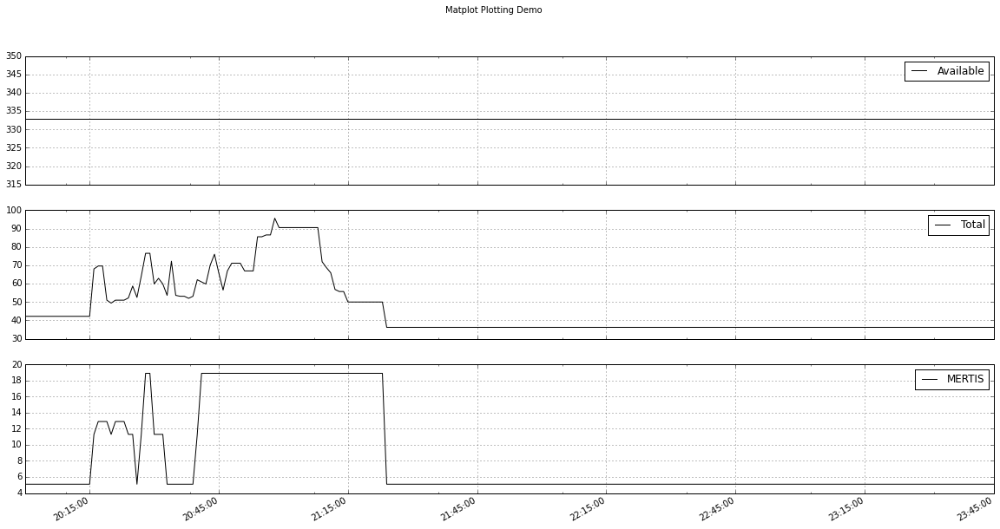

In [41]:
power_usage.data[['Available', 'Total', 'MERTIS']].plot(title='Matplot Plotting Demo', grid=True, subplots=True);

The **STATIC** possibilities are endless...

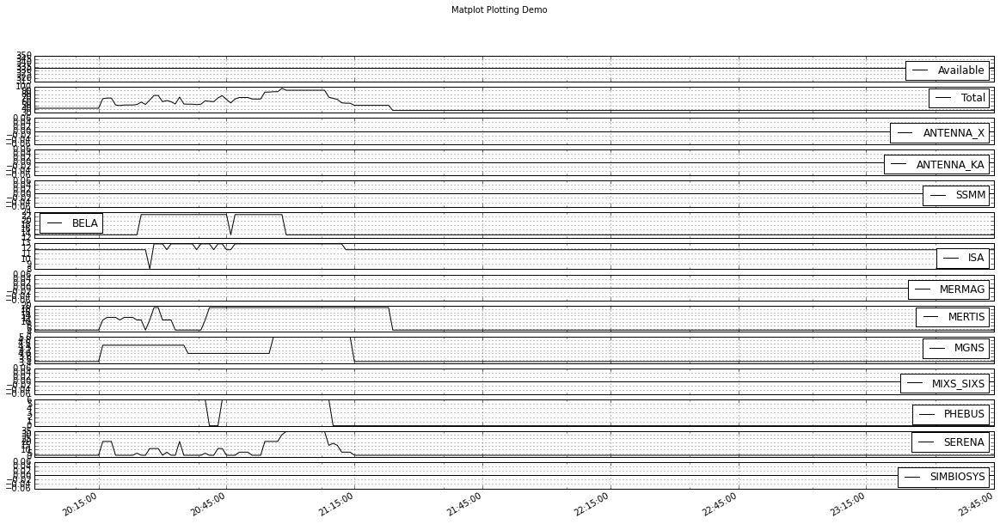

In [107]:
power_usage.data.plot(title='Matplot Plotting Demo', grid=True, subplots=True);

##Plot.ly

However, for increased interactivity, trace value flags and responsive zooming I'm using the Plotly online plotting library.

**pyops** has a simple yet flexible plotting API. You just have to run the **iplot** method on the **datatable object**  you want to plot.

If we pass the variable **with_layout=True**, the plot will show a fixed layout at the background. Use **with_layout=False** to disable it.

In [18]:
power_usage.iplot(with_layout=False)

Plot.ly does have some limitiation in the number of points it can plot and work with. 

This is due mainly to the fact that the data is processed on the Plot.ly servers and they don't want people sending Gbits of data and crashing their system.

It can howerver deal with streaming data and that could be used to represent - as needed - larger data sets.

There are alternatives to Plot.ly. 

Bokeh is an upcoming challenger. Google it to be impressed...

But for what we are doing now, and compared to where we were before, **Plot.ly** is "nice".

##Prototyping

One of the great advantages of the Notebook is in prototyping code. 

You can start by running each command in a single, isolated cell; later group the commands together in the functions within the Notebook; and if everything works as you expect later move the functions into external importable libraries.

Define Perihelion Seasons based on the power restrictions. We do this manually here but it could be easily built from the power budget file.

In [57]:
# these ranges are 1 day (each end) bigger than the power restricted periods.
perihelia = {'1' : (dt( 2024,  6,  1, 19, 18), dt( 2024,  6, 25, 17, 18)),
                   '2' : (dt( 2024,  8, 28, 18, 18), dt( 2024,  9, 21, 16, 48)),
                   '3' : (dt( 2024, 11, 24, 17, 48), dt( 2024, 12, 18, 15, 48)),
                   '4' : (dt( 2025,  2, 21, 16, 48), dt( 2025,  3, 17, 15, 18)),
                   '5' : (dt( 2025,  5, 19, 16, 18), dt( 2025,  6,  9, 21, 18))}

Define a mini-function for plotting the perihelia only.

In [66]:
def periplot(perihelion):
    power_usage.iplot(limits = perihelia[str(perihelion)], 
                                  y_title='Power [W]', 
                                  title='MPO Available Power and Instrument Consumption<br>Perhelion {}'.format(str(perihelion)))

Here's a close-up of the power situation around **Perihelion 1: 2024-6-1, 19:18** _to_ **2024-6-25, 17:18**  

In [67]:
periplot(1)

In [69]:
power_usage.select(['Available', 'ANTENNA_X']).iplot(limits = perihelia['2'], y_title='Power [W]', title='MPO Available Power and Antenna Consumption<br>Perhelion 2')

Of course you can only plot seasons you have data for...

In [45]:
periplot(5)

OOOPS: Your requested range appears to be outside the range of the data set:
data set > 2024-05-07 00:00:00 to 2025-05-07 00:00:00
limits     > 2025-05-19 16:18:00 to 2025-06-09 21:18:00


##Save the Table Objects

In Python objects can be saved 'as-are' using something called "pickling".

In [19]:
! [ -d pickles ] || mkdir pickles

In [20]:
pickle.dump( power_usage, open( "pickles/power_usage.p", "wb" ) )

Pickling saves the object in a compressed  semi-binary format that can later be <b>quickly</b> re-loaded.

If we do a test to see how long this reload takes compared to the original reading-in of the file...

In [21]:
%timeit test_df = pickle.load( open( "pickles/power_usage.p", "rb" ) )

100 loops, best of 3: 2.57 ms per loop


In [22]:
%timeit test_df2 = pyops.powertable(power_avg_file)

8852 redundant lines removed
8852 redundant lines removed
8852 redundant lines removed
8852 redundant lines removed
1 loops, best of 3: 1.72 s per loop


While the difference for small, low-res simulation is small... we see the difference for these large, hi-res files is a factor of 25...

... and remember that the re-loaded pickle will include any post-processing done on the original dataframe, such as merging it with the power budget data.

## Data Rate Analysis

To read the average data rate file output by EPS we define an instance of the **datatable** class.

In [4]:
data_rate_avg_file = 'test/data/data_rate_avg.out'

In [5]:
data_rate_avg = pyops.datatable(data_rate_avg_file)

If we look at the head of the resulting dataframe we see some characteristics that were not present in the power table.

It has multi-level index. And an additional column showing the data volume per timestep has been generated for each instrument.

In [6]:
data_rate_avg.head()

ANTENNA                         BELA                          \
                Accum Downlink    Volume     Accum Download Memory  Upload   
                 Gbit   kbit/s      Gbit      Gbit   kbit/s   Gbit  kbit/s   
Date                                                                         
2024-05-07   0.000000        0  0.000000  0.000000        0      0   0.099   
2024-05-08   7.438953        0  7.438953  0.365467        0      0   9.888   
2024-05-09  16.418688        0  8.979735  0.737165        0      0   5.568   
2024-05-10  25.371039        0  8.952351  1.109660        0      0  12.405   
2024-05-11  34.208517        0  8.837478  1.479332        0      0   0.134   

                           ISA                                     MERMAG  \
              Volume     Accum Download Memory Upload    Volume     Accum   
                Gbit      Gbit   kbit/s   Gbit kbit/s      Gbit      Gbit   
Date                                                                        
2024-05-07  0.000000  0.000000        0      0  0.000  0.000000  0.000000   
2024-05-08  0.365467  0.140525        0      0  1.734  0.140525  0.030931   
2024-05-09  0.371697  0.285717        0      0  1.734  0.145192  0.061862   
2024-05-10  0.372495  0.430909        0      0  1.734  0.145192  0.092794   
2024-05-11  0.369672  0.575175        0      0  1.734  0.144266  0.123725   

                                                MERTIS                         \
           Download Memory Upload    Volume      Accum Download Memory Upload   
             kbit/s   Gbit kbit/s      Gbit       Gbit   kbit/s   Gbit kbit/s   
Date                                                                            
2024-05-07        0      0  0.358  0.000000   0.000000        0      0    0.0   
2024-05-08        0      0  0.358  0.030931   3.885424        0      0  118.0   
2024-05-09        0      0  0.358  0.030931   8.008112        0      0  240.0   
2024-05-10        0      0  0.358  0.030931  12.004162        0      0    0.4   
2024-05-11        0      0  0.358  0.030931  15.855224        0      0    0.4   

                          MGNS                                   MIXS-SIXS  \
              Volume     Accum Download Memory  Upload    Volume     Accum   
                Gbit      Gbit   kbit/s   Gbit  kbit/s      Gbit      Gbit   
Date                                                                         
2024-05-07  0.000000  0.000000        0      0  0.0000  0.000000  0.000000   
2024-05-08  3.885424  0.294034        0      0  3.4384  0.294034  0.787254   
2024-05-09  4.122688  0.591112        0      0  3.4384  0.297078  1.787013   
2024-05-10  3.996050  0.888190        0      0  3.4384  0.297078  2.577045   
2024-05-11  3.851062  1.185267        0      0  3.4384  0.297078  3.366793   

                                             MORE                         \
           Download Memory Upload    Volume Accum Download Memory Upload   
             kbit/s   Gbit kbit/s      Gbit  Gbit   kbit/s   Gbit kbit/s   
Date                                                                       
2024-05-07        0      0   0.00  0.000000     0        0      0      0   
2024-05-08        0      0   9.29  0.787254     0        0      0      0   
2024-05-09        0      0   9.29  0.999759     0        0      0      0   
2024-05-10        0      0   9.29  0.790032     0        0      0      0   
2024-05-11        0      0   9.00  0.789748     0        0      0      0   

                     PHEBUS                                      SERENA  \
           Volume     Accum Download Memory  Upload    Volume     Accum   
             Gbit      Gbit   kbit/s   Gbit  kbit/s      Gbit      Gbit   
Date                                                                      
2024-05-07      0  0.000000        0      0   0.000  0.000000  0.000000   
2024-05-08      0  0.241009        0      0   0.000  0.241009  0.408729   
2024-05-09      0  0.511508        0      0   0.0


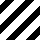
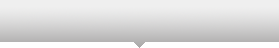
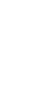
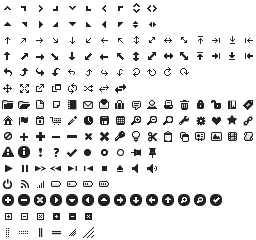
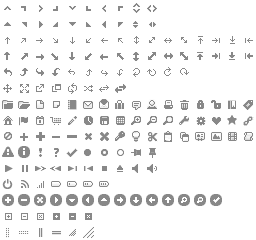
...
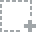
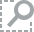
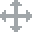
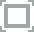
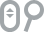

Ooops, too many parameters, not enough colors...
[['ANTENNA', 'Downlink'], ['ANTENNA', 'Accum'], ['SSMM', 'Memory'], ['SSMM', 'Accum'], ['BELA', 'Upload'], ['BELA', 'Download'], ['BELA', 'Memory'], ['BELA', 'Accum'], ['ISA', 'Upload'], ['ISA', 'Download'], ['ISA', 'Memory'], ['ISA', 'Accum'], ['MERMAG', 'Upload'], ['MERMAG', 'Download'], ['MERMAG', 'Memory'], ['MERMAG', 'Accum'], ['MERTIS', 'Upload'], ['MERTIS', 'Download'], ['MERTIS', 'Memory'], ['MERTIS', 'Accum'], ['MGNS', 'Upload'], ['MGNS', 'Download'], ['MGNS', 'Memory'], ['MGNS', 'Accum'], ['MORE', 'Upload'], ['MORE', 'Download'], ['MORE', 'Memory'], ['MORE', 'Accum'], ['PHEBUS', 'Upload'], ['PHEBUS', 'Download'], ['PHEBUS', 'Memory'], ['PHEBUS', 'Accum'], ['SERENA', 'Upload'], ['SERENA', 'Download'], ['SERENA', 'Memory'], ['SERENA', 'Accum'], ['SIMBIOSYS-STC', 'Upload'], ['SIMBIOSYS-STC', 'Download'], ['SIMBIOSYS-STC', 'Memory'], ['SIMBIOSYS-STC', 'Accum'], ['SIMBIOSYS-HRIC', 'Upload'], ['SIMBIOSYS-HRIC', 'Download'], ['SIMBIOS

IndexError: list index out of range

In [7]:
data_rate_avg.data_plot()

This dataframe shows what was used by the instruments during the simulation but we would like to compare this to the available power.

So we read in the downlink budget file by defining an instance of the top-level **epstable** class.

In [43]:
downlink_budget = pyops.epstable(downlink_budget_file)

If we look at the head of this downlink budget table we can see that the column headings are not very informative. 

This is because there is no standard heading format for the downlink budget file.

In [44]:
downlink_budget.head()

,1,2,3,4,5,6
date,,,,,,
2024-04-30,174.1,261.1,435.2,174.1,261.1,435.2
2024-05-01,174.1,208.9,382.9,174.1,261.1,435.2
2024-05-02,174.1,208.9,382.9,130.5,208.9,339.4
2024-05-03,174.1,208.9,382.9,174.1,208.9,382.9
2024-05-04,130.5,208.9,339.4,130.5,261.1,391.6


When we read in the file, the epstable read method created a header attribute as well as the data attribute seen above, and this we can examine.

In [45]:
downlink_budget.header

{'- APM Speed Limitations': 'No (0)',
 '- Bit Rate limitation': 'Yes (348.1204 kbps)',
 '- Ground Station Availability': '95%',
 '- Reaction Wheel Offloading': 'No (0)',
 '- Solar Activity': 'Normal (1)',
 '- Solar Conjunctions': 'Yes',
 '- Turbo 1/2 for high bitrate': 'No (0)',
 'Data Columns': 'CeX    CeK    CeB    MaX    MaK    MaB',
 'Factors Considered': '',
 'Factors NOT Considered': '',
 'len': 14}

This header, because it is not standard, is not as informative as that of the data rate table, but it does have a 'Data Columns' entry and this we can parse and use to build a mutli-level index for the downlink budget table.

In [46]:
channels = downlink_budget.header['Data Columns'].split()

In [47]:
arrays = [channels, ['Downlink' for x in channels], ['kbit/s' for x in channels]]

In [48]:
arrays

[['CeX', 'CeK', 'CeB', 'MaX', 'MaK', 'MaB'],
 ['Downlink', 'Downlink', 'Downlink', 'Downlink', 'Downlink', 'Downlink'],
 ['kbit/s', 'kbit/s', 'kbit/s', 'kbit/s', 'kbit/s', 'kbit/s']]

In [49]:
downlink_budget.data.columns = pd.MultiIndex.from_arrays(arrays, names=('channel', 'type', 'unit'))

We now have a budget dataframe with a mutli-level index.

In [50]:
downlink_budget.head()

channel,CeX,CeK,CeB,MaX,MaK,MaB
type,Downlink,Downlink,Downlink,Downlink,Downlink,Downlink
unit,kbit/s,kbit/s,kbit/s,kbit/s,kbit/s,kbit/s
date,,,,,,
2024-04-30,174.1,261.1,435.2,174.1,261.1,435.2
2024-05-01,174.1,208.9,382.9,174.1,261.1,435.2
2024-05-02,174.1,208.9,382.9,130.5,208.9,339.4
2024-05-03,174.1,208.9,382.9,174.1,208.9,382.9
2024-05-04,130.5,208.9,339.4,130.5,261.1,391.6


We now want to join this budget data to the data rate datatable and we do this with the **join** method on the **data_rate_avg** object.

In [51]:
data_rate_avg.join(downlink_budget, in_place=True)

In [52]:
data_rate_avg.head()

channel             ANTENNA_KA                 ANTENNA_X                  \
type                     Accum Downlink Volume     Accum Downlink Volume   
unit                      Gbit   kbit/s   Gbit      Gbit   kbit/s   Gbit   
2022-10-06 20:00:00          0        0      0         0        0      0   
2022-10-06 20:44:59          0        0      0         0        0      0   
2022-10-06 20:45:00          0        0      0         0        0      0   
2022-10-06 20:45:01          0        0      0         0        0      0   
2022-10-06 20:45:02          0        0      0         0        0      0   

channel                      BELA                                       \
type                        Accum Download Memory Upload        Volume   
unit                         Gbit   kbit/s   Gbit kbit/s          Gbit   
2022-10-06 20:00:00  0.000000e+00        0      0  0.000  0.000000e+00   
2022-10-06 20:44:59  0.000000e+00        0      0  0.000  0.000000e+00   
2022-10-06 20:45:00  1.000000e-07        0      0  0.099  1.000000e-07   
2022-10-06 20:45:01  2.000000e-07        0      0  0.099  1.000000e-07   
2022-10-06 20:45:02  3.000000e-07        0      0  0.099  1.000000e-07   

channel                  CeB      CeK      CeX           ISA                  \
type                Downlink Downlink Downlink         Accum Download Memory   
unit                  kbit/s   kbit/s   kbit/s          Gbit   kbit/s   Gbit   
2022-10-06 20:00:00    435.2    261.1    174.1  0.000000e+00        0      0   
2022-10-06 20:44:59    435.2    261.1    174.1  0.000000e+00        0      0   
2022-10-06 20:45:00    435.2    261.1    174.1  1.900000e-07        0      0   
2022-10-06 20:45:01    435.2    261.1    174.1  3.800000e-07        0      0   
2022-10-06 20:45:02    435.2    261.1    174.1  5.800000e-07        0      0   

channel                                  MERMAG                                \
type                Upload        Volume  Accum Download Memory Upload Volume   
unit                kbit/s          Gbit   Gbit   kbit/s   Gbit kbit/s   Gbit   
2022-10-06 20:00:00  0.000  0.000000e+00      0        0      0      0      0   
2022-10-06 20:44:59  0.000  0.000000e+00      0        0      0      0      0   
2022-10-06 20:45:00  0.192  1.900000e-07      0        0      0      0      0   
2022-10-06 20:45:01  0.192  1.900000e-07      0        0      0      0      0   
2022-10-06 20:45:02  0.192  2.000000e-07      0        0      0      0      0   

channel             MERTIS                                MGNS           \
type                 Accum Download Memory Upload Volume Accum Download   
unit                  Gbit   kbit/s   Gbit kbit/s   Gbit  Gbit   kbit/s   
2022-10-06 20:00:00      0        0      0      0      0     0        0   
2022-10-06 20:44:59      0        0      0      0      0     0        0   
2022-10-06 20:45:00      0        0      0      0      0     0        0   
2022-10-06 20:45:01      0        0      0      0      0     0        0   
2022-10-06 20:45:02      0        0      0      0      0     0        0   

channel                                  MIXS_SIXS                         \
type                Memory Upload Volume     Accum Download Memory Upload   
unit                  Gbit kbit/s   Gbit      Gbit   kbit/s   Gbit kbit/s   
2022-10-06 20:00:00      0      0      0         0        0      0      0   
2022-10-06 20:44:59      0      0      0         0        0      0      0   
2022-10-06 20:45:00      0      0      0         0        0      0      0   
2022-10-06 20:45:01      0      0      0         0        0      0      0   
2022-10-06 20:45:02      0      0      0         0        0      0      0   

channel                         MaB      MaK      MaX PHEBUS                  \
type                Volume Downlink Downlink Downlink  Accum Download Memory   
unit                  Gbit   kbit/s   kbit/s   kbit/s   Gbit   kbit/s   Gbit   
2022-10-06 20:00:00      0    435.2    261.1    17

Save datatable to pickle object

In [53]:
pickle.dump( data_rate_avg, open( "pickles/data_rate_avg.p", "wb" ) )

Let's plot the data rate data... all of it. We'll turn off the legend because it's very big and not really needed as we will see.

In [55]:
data_rate_avg.iplot(showlegend=False)

HTTPError: 504 Server Error: GATEWAY_TIMEOUT

# Slicing and Sub-Selection

You may not always want to examine or plot all of the data. 

In [60]:
data_rate_avg.head()

channel             ANTENNA_KA                 ANTENNA_X                  \
type                     Accum Downlink Volume     Accum Downlink Volume   
unit                      Gbit   kbit/s   Gbit      Gbit   kbit/s   Gbit   
2022-10-06 20:00:00          0        0    NaN         0        0    NaN   
2022-10-06 20:44:59          0        0    NaN         0        0    NaN   
2022-10-06 20:45:00          0        0    NaN         0        0    NaN   
2022-10-06 20:45:01          0        0    NaN         0        0    NaN   
2022-10-06 20:45:02          0        0    NaN         0        0    NaN   

channel                      BELA                                    CeB  \
type                        Accum Download Memory Upload Volume Downlink   
unit                         Gbit   kbit/s   Gbit kbit/s   Gbit   kbit/s   
2022-10-06 20:00:00  0.000000e+00        0      0  0.000    NaN    435.2   
2022-10-06 20:44:59  0.000000e+00        0      0  0.000    NaN    435.2   
2022-10-06 20:45:00  1.000000e-07        0      0  0.099    NaN    435.2   
2022-10-06 20:45:01  2.000000e-07        0      0  0.099    NaN    435.2   
2022-10-06 20:45:02  3.000000e-07        0      0  0.099    NaN    435.2   

channel                  CeK      CeX           ISA                         \
type                Downlink Downlink         Accum Download Memory Upload   
unit                  kbit/s   kbit/s          Gbit   kbit/s   Gbit kbit/s   
2022-10-06 20:00:00    261.1    174.1  0.000000e+00        0      0  0.000   
2022-10-06 20:44:59    261.1    174.1  0.000000e+00        0      0  0.000   
2022-10-06 20:45:00    261.1    174.1  1.900000e-07        0      0  0.192   
2022-10-06 20:45:01    261.1    174.1  3.800000e-07        0      0  0.192   
2022-10-06 20:45:02    261.1    174.1  5.800000e-07        0      0  0.192   

channel                    MERMAG                               MERTIS  \
type                Volume  Accum Download Memory Upload Volume  Accum   
unit                  Gbit   Gbit   kbit/s   Gbit kbit/s   Gbit   Gbit   
2022-10-06 20:00:00    NaN      0        0      0      0    NaN      0   
2022-10-06 20:44:59    NaN      0        0      0      0    NaN      0   
2022-10-06 20:45:00    NaN      0        0      0      0    NaN      0   
2022-10-06 20:45:01    NaN      0        0      0      0    NaN      0   
2022-10-06 20:45:02    NaN      0        0      0      0    NaN      0   

channel                                            MGNS                  \
type                Download Memory Upload Volume Accum Download Memory   
unit                  kbit/s   Gbit kbit/s   Gbit  Gbit   kbit/s   Gbit   
2022-10-06 20:00:00        0      0      0    NaN     0        0      0   
2022-10-06 20:44:59        0      0      0    NaN     0        0      0   
2022-10-06 20:45:00        0      0      0    NaN     0        0      0   
2022-10-06 20:45:01        0      0      0    NaN     0        0      0   
2022-10-06 20:45:02        0      0      0    NaN     0        0      0   

channel                           MIXS_SIXS                                \
type                Upload Volume     Accum Download Memory Upload Volume   
unit                kbit/s   Gbit      Gbit   kbit/s   Gbit kbit/s   Gbit   
2022-10-06 20:00:00      0    NaN         0        0      0      0    NaN   
2022-10-06 20:44:59      0    NaN         0        0      0      0    NaN   
2022-10-06 20:45:00      0    NaN         0        0      0      0    NaN   
2022-10-06 20:45:01      0    NaN         0        0      0      0    NaN   
2022-10-06 20:45:02      0    NaN         0        0      0      0    NaN   

channel                  MaB      MaK      MaX PHEBUS                         \
type                Downlink Downlink Downlink  Accum Download Memory Upload   
unit                  kbit/s   kbit/s   kbit/s   Gbit   kbit/s   Gbit kbit/s   
2022-10-06 20:00:00    435.2    261.1    174.1      0        0      0      0   
2022-10-06 20:44:59    435

In [61]:
data_rate_avg.select(('CeX', 'CeK', 'BELA','MERTIS'), ('Volume', 'Downlink'), None).head()

channel,BELA,CeK,CeX,MERTIS
type,Volume,Downlink,Downlink,Volume
unit,Gbit,kbit/s,kbit/s,Gbit
2022-10-06 20:00:00,NaN,261.1,174.1,NaN
2022-10-06 20:44:59,NaN,261.1,174.1,NaN
2022-10-06 20:45:00,NaN,261.1,174.1,NaN
2022-10-06 20:45:01,NaN,261.1,174.1,NaN
2022-10-06 20:45:02,NaN,261.1,174.1,NaN


The slicing is "semi-clever"...

In [62]:
data_rate_avg.select(('CeX', 'CeK', 'BELA','MERTIS'), ('Volume', 'Downlink'), None).iplot(showlegend=False)

The software recognises the different data types (volume, rates) and splits the data across multiple axes as needed. 

More than 2 axes is also possible but I haven't seen a practical need for it ... yet!

#BOKEH

In [93]:
power_usage.instruments

['ANTENNA_X',
 'ANTENNA_KA',
 'SSMM',
 'BELA',
 'ISA',
 'MERMAG',
 'MERTIS',
 'MGNS',
 'MIXS_SIXS',
 'PHEBUS',
 'SERENA',
 'SIMBIOSYS']


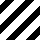
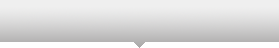
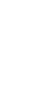
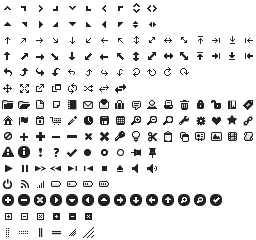
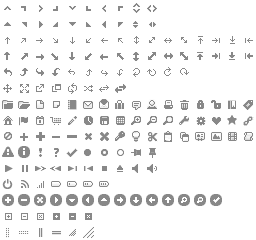
...
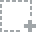
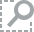
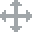
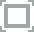
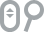

In [99]:
power_usage.brewer_plot(['MERTIS','SERENA','BELA', 'MERMAG'])

In [13]:
modes_csv = 'test/data/module_states_csv.out'

In [14]:
modes_csv

'test/data/module_states_csv.out'

In [15]:
modes = pyops.Modes(modes_csv)

In [16]:
modules = pyops.Modes('test/data/modes_csv.out')

In [18]:
modes.merge_schedule(modules.data)

(                    ANTENNA_X X_TX ANTENNA_KA Ka_TX ISA HEATER  \
Date & Time                                                      
2022-10-06 20:00:00            OFF              OFF         ON   
2022-10-06 20:15:24            OFF              OFF         ON   
2022-10-06 20:15:26            OFF              OFF         ON   
2022-10-06 20:19:00            OFF              OFF         ON   
2022-10-06 20:24:00            OFF              OFF         ON   
2022-10-06 20:24:10            OFF              OFF         ON   
2022-10-06 20:25:10            OFF              OFF         ON   
2022-10-06 20:26:54            OFF              OFF         ON   
2022-10-06 20:27:00            OFF              OFF         ON   
2022-10-06 20:30:00            OFF              OFF         ON   
2022-10-06 20:30:10            OFF              OFF         ON   
2022-10-06 20:31:15            OFF              OFF         ON   
2022-10-06 20:31:24            OFF              OFF         ON   
2022-10-0

AttributeError: 'tuple' object has no attribute 'data'


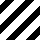
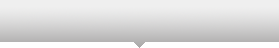
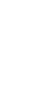
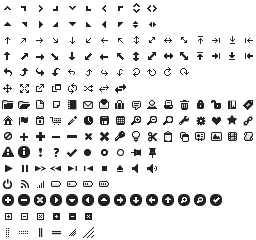
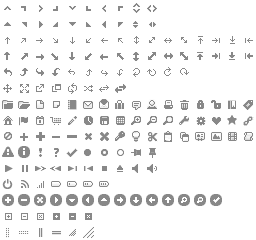
...
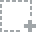
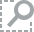
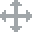
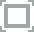
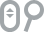

In [47]:
modes.plot_schedule()

# Dashboard
Dashboard in action...


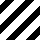
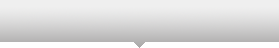
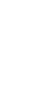
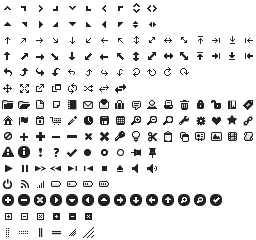
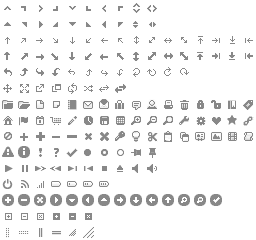
...
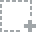
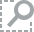
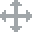
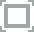
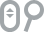

In [3]:
dashboard = pyops.Dashboard()

In [4]:
ls test/data

actions.out             DS_latency_csv.out      module_states.out
conflicts2_csv.out      DS_transfers2_csv.out   power_avg2_csv.out
conflicts_csv.out       DS_transfers_csv.out    power_avg_csv.out
conflicts.out           imagedatadump.dat       power_avg.out
data_rate_avg2_csv.out  modes2_csv.out          power_budget.pwr
data_rate_avg_csv.out   modes_csv.out           state_params.out
data_rate_avg.out       modes.out               timeline2_csv.out
downlink_profile.brf    module_states2_csv.out  timeline_csv.out
DS_latency2_csv.out     module_states_csv.out   timeline.out


In [5]:
dashboard.load_directory("test/data")

8852 redundant lines removed
2698 redundant lines removed


In [6]:
dashboard.launch(['MERTIS','BELA'])

In [35]:
dashboard.launch_tab(['MERTIS','PHEBUS'])

#EVF Files

In [16]:
evf = pyops.Evf("/lhome/planaspa/Documents/Bepi/BepiData/OGS/MR_SOA2013_APH_MAP_ON.evf")

In [20]:
evf.h

<pyops.evf.Evf instance at 0x7f4059209998>

In [15]:
evf.to_file("/lhome/planaspa/Documents/Bepi/BepiData/OGS/MR_SOA2013_APH_MAP_OFFONOFFOFF.evf")

In [21]:
evf.header

['# EVF Filename: Bepi_2013-11-18_12-35-20.evf\n',
 '# Generation Time: 18-Nov-2013_12:35:21\n',
 '# (1882 events in list)\n',
 '# 16-May-2024_10:56:20  DTNTERM_DAYTIME_START  (Count = 3)\n',
 '# 16-May-2024_11:04:00  DTNTERM_DAYTIME_70_START  (Count = 3)\n',
 '# 16-May-2024_11:46:40  DTNTERM_DAYTIME_70_END  (Count = 3)\n',
 '# 16-May-2024_11:53:30  DTNTERM_DAYTIME_END  (Count = 3)\n',
 '# 16-May-2024_13:18:00  DTNTERM_DAYTIME_START  (Count = 4)\n',
 '# 16-May-2024_13:25:40  DTNTERM_DAYTIME_70_START  (Count = 4)\n',
 '# 16-May-2024_14:08:20  DTNTERM_DAYTIME_70_END  (Count = 4)\n',
 '# 16-May-2024_14:15:10  DTNTERM_DAYTIME_END  (Count = 4)\n',
 '# 16-May-2024_15:39:50  DTNTERM_DAYTIME_START  (Count = 5)\n',
 '# 16-May-2024_15:47:30  DTNTERM_DAYTIME_70_START  (Count = 5)\n',
 '# 16-May-2024_16:30:10  DTNTERM_DAYTIME_70_END  (Count = 5)\n',
 '# 16-May-2024_16:36:50  DTNTERM_DAYTIME_END  (Count = 5)\n',
 '# 16-May-2024_18:01:30  DTNTERM_DAYTIME_START  (Count = 6)\n',
 '# 16-May-2024_18:09: